In [1]:
name_subj = "S8"

import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Reading raw BDF, setting up bipolar references and montage

In [2]:
raw = mne.io.read_raw_bdf('../raw_data/%s.bdf'%name_subj,preload=True, verbose=True)

Extracting EDF parameters from /media/gabriel/DATA/ForceEEG/raw_data/S8.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...


In [3]:
mne.set_bipolar_reference(raw,anode=['EXG1','EXG3','EXG5','EXG7'],cathode=['EXG2','EXG4','EXG6','Fp2'],ch_name=['EMG_L','EMG_R','EOGH','EOGV'],copy=False, drop_refs=False) #fixe les références bipolaires pour les électrodes externes
raw.set_channel_types({'EMG_L':'emg','EMG_R':'emg','EOGH':'eog','EOGV':'eog','EXG8':'misc','Erg1':'misc','Erg2':'misc'}) #Détermine les types de canaux 
raw.set_eeg_reference(['EXG8']) #référence eeg  mastoide gauche
raw.drop_channels(['EXG1','EXG3','EXG5','EXG7','EXG2','EXG4','EXG6'])

Bipolar channel added as "EMG_L".
Bipolar channel added as "EMG_R".
Bipolar channel added as "EOGH".
Bipolar channel added as "EOGV".
EEG channel type selected for re-referencing
Applying a custom EEG reference.


<RawEDF | S8.bdf, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

## Montage

Here I recover the measurment made using ElGuide, however I only use one file (.sfp) from the three generated by subject, but it seems to be OK.

In [4]:
EEGhead_pos = pd.read_csv('../raw_data/data_ForceEEG_Montage/%s_Force_EEG.sfp'%name_subj,skiprows=3, sep="\t", index_col=0,header=None,usecols=[0,3,5,7])/1000 #mm scale
ref_pos = pd.read_csv('../raw_data/data_ForceEEG_Montage/%s_Force_EEG.sfp'%name_subj,skiprows=0, sep="\t", index_col=0,header=None,usecols=[0,3,6,9],nrows=3)/1000 #mm scale

EEGhead_pos = EEGhead_pos[(np.abs(EEGhead_pos[3]) < (np.std(EEGhead_pos[3])*8))]#removes weird postiion samples larger than 8sd

EEGkeys = EEGhead_pos[:64].index
EEGvalues = np.asarray(EEGhead_pos[:64].reset_index(drop=True))
EEG_points = dict(zip(EEGkeys, EEGvalues))

left, nasion, right = ref_pos.loc["fidt9"].values,ref_pos.loc["fidnz"].values,ref_pos.loc["fidt10"].values #Check LR correctness
head_points = np.asarray(EEGhead_pos[64:].reset_index(drop=True))

dig_montage = mne.channels.make_dig_montage(ch_pos=EEG_points, nasion=nasion, lpa=left, rpa=right, 
                                            hsp=head_points, hpi=None, coord_frame='head')

### Plotting sensor locations

Creating RawArray with float64 data, n_channels=64, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


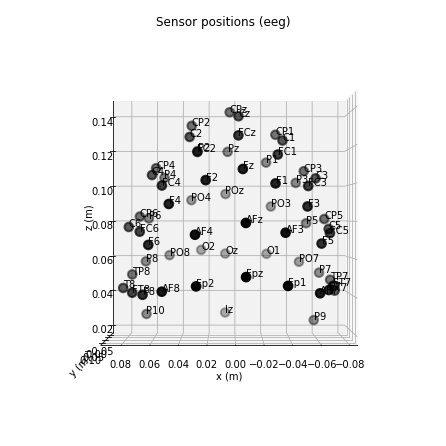

In [5]:
dig_montage.plot(kind='3d');


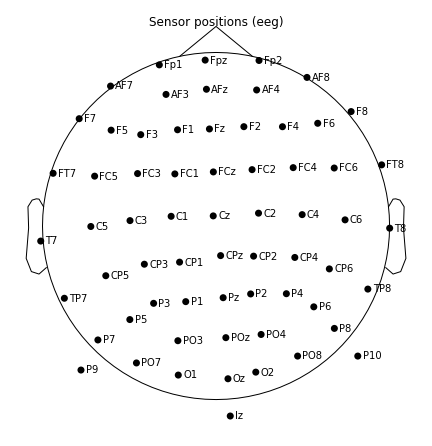

In [6]:
raw.set_montage(dig_montage)
raw.plot_sensors(show_names=True);

# Low-pass filtering

In [7]:
raw.filter(None, 100, None,l_trans_bandwidth='auto',filter_length='auto',phase='zero') #filtre les données entre 0.01 et 100 Hz


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 135 samples (0.132 sec)



<RawEDF | S8.bdf, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

## Checking for bad electrodes before applying average referencing

Here I take a first quick look at the data to detect really faulty or flat electrodes, plot not displayed in the notebook I send you because it is not very useful

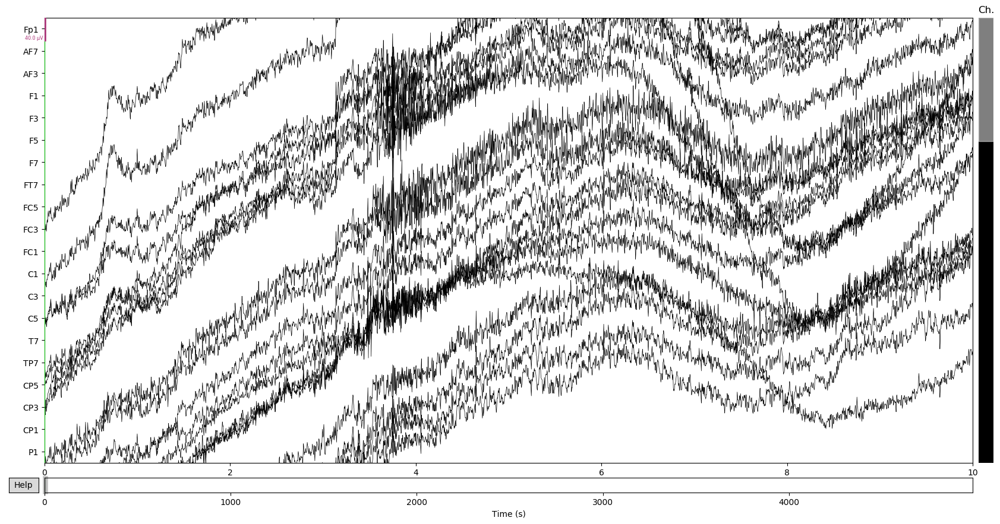

In [8]:
%matplotlib qt
raw.plot()

Notes : 
- RAS

In [9]:
raw.info['bads']

[]

I save the data, hence saving the montage, the low-pass filtered data, the annotation of the bad channel (but none for this subject)

Additionally I re-reference to average as EXG8 is particularly noisy making artifact detection difficult.

In [10]:
raw.set_eeg_reference('average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.


<RawEDF | S8.bdf, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

In [12]:
raw.save("%s/pre_rejection_%s.fif"%(name_subj,name_subj),overwrite=True) #sauvegarde les données au format fif pour la suite des traitements

Writing /media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_rejection_S8.fif


<ipython-input-12-e39f8df35fab>:1: RuntimeWarning: This filename (/media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_rejection_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw.save("%s/pre_rejection_%s.fif"%(name_subj,name_subj),overwrite=True) #sauvegarde les données au format fif pour la suite des traitements


Closing /media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_rejection_S8.fif [done]


# Rejecting artefacts

## For the remaining sections and up to the ICA reconstruction I only work with 1Hz High pass filtered data 

The reason being that annotation marked as bad, if not previously filtered to remove slow drifts, gives crazy ICA results (probably because it then captures a lot of edge artifacts from the drifts occuring between the breaks), plus lightly filtered data and average reference seems to ease the detection of artifact, both visually and with the ICA. But the final data (after reconstruction) will remain filtered at 0.01Hz as we usually do and as is recommended for ERP analysis

In [2]:
raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=False)

Opening raw data file S8/pre_rejection_S8.fif...


<ipython-input-2-51b23dce2bfc>:1: RuntimeWarning: This filename (S8/pre_rejection_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=False)


    Range : 0 ... 5107711 =      0.000 ...  4987.999 secs
Ready.


In [3]:
filt_raw = raw.copy().load_data().filter(l_freq=1., h_freq=None) # I filter to ease processing (and problem with BAD_breaks)

Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3379 samples (3.300 sec)



### Recovering events

Code to recover EMG markers and to merge force condition trigger and stim trigger (had to send them separately because of the number of bits and the coding scheme).

In [4]:
original_evts = pd.read_csv('../processing_EMG/processed/corrected/%s_corrected_evts.csv'%name_subj)
original_evts.code = [int(x) for x in original_evts.code]
original_evts.chan = [int(x) for x in original_evts.chan]
del original_evts["time"]
resp_id = [200, 100]
stim_id = [111,112,113,121,122,123,211,212,213,221,222,223]
force_id = [1,2]
combined_id = [int(str(x[1]) + str(x[0]))  for x in zip(np.tile(stim_id,2), np.repeat(force_id,len(stim_id)))]

emg_chan = [0,1]


evts = original_evts.values

i = 0
max_trials = np.sum(np.isin(evts[:,1], stim_id))
while i < len(evts)-1:
    while evts[i,1] not in force_id and i < len(evts)-1:
        i += 1
    force_trigger = i
    while evts[i,1] not in stim_id and i < len(evts)-1:
        i += 1
    stim_trigger = i
    if i < len(evts)-1:
        evts[stim_trigger, 1] = int(str(evts[force_trigger, 1]) + str(evts[stim_trigger, 1]))
    i += 1
print(np.sum(np.isin(evts[:,1], stim_id)) == 0)
print(np.sum(np.isin(evts[:,1], combined_id)) == max_trials)
original_evts = original_evts.drop(original_evts.iloc[np.isin(evts[:,1], force_id)].index)

True
True


Saving the extracted events

In [5]:
original_evts.to_csv('%s/events_%s.csv'%(name_subj, name_subj))

Total of trials used in the following code

In [6]:
np.sum(np.isin(original_evts.code.values, combined_id))

2448

Correcting the event file to adapt to MNEs events format and keeping only stimuls and response events

In [7]:
evts = original_evts.values
stim_rep_evts = evts[np.isin(evts[:,1], combined_id) | np.isin(evts[:,1], resp_id) ]
stim_rep_evts[:,2] = stim_rep_evts[:,1]

__FYI__ : visualisation of the course of the trials (y= trigger, x=recorded sample) during the experiment for the subject: 

_stimulus trigger_ = XXXX = Force (1:low, 2:High), SAT (1:Accuracy, 2:Speed), expected response (1:left, 2:Right), contrast (1 - 3)

_response trigger_ = 100 (left) 200 (right)

<ipython-input-8-b319de41a708>:1: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(stim_rep_evts);


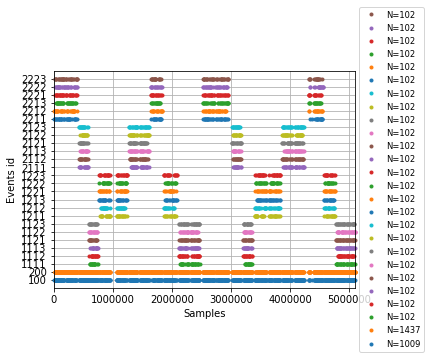

In [8]:
mne.viz.plot_events(stim_rep_evts);

### Detecting and annotating breaks

In the two following cells I mark the period of breaks between the block. I do it because we cannot use these periods in the ICA because they are highly noisy, hence I annotate them and exclude them from the following ICA analysis. I define a break as a duration of more than 20 sec between a response and a stimulus trigger (the duration might be different for other subjects but 20 seconds catches the number of expected breaks)

In [11]:
onset_breaks = stim_rep_evts[np.where(np.diff(stim_rep_evts[:,0], n=1) > (1024*10))][:,0]/1024 #detecting latencies between triggers > 5 sec (searching for the 23 self-paced breaks, and the start of the recording)
offset_breaks = np.flip(np.flip(stim_rep_evts)[np.where(np.diff(np.flip(stim_rep_evts[:,0]), n=1) < -(1024*10))])[:,0]/1024

onset_breaks = onset_breaks + 1 #add 1 sec after last response trigger
offset_breaks = offset_breaks - 1 #removes 1 sec before next stimulus trigger

onset_breaks = np.insert(onset_breaks,0,0)#just adding start of the recording to the breaks
onset_breaks = np.insert(onset_breaks,-1, stim_rep_evts[-1,0]/1024+1)#just adding end of the recording to the breaks

offset_breaks = np.insert(offset_breaks,0,stim_rep_evts[0,0]/1024-1)#just adding start of the recording to the breaks
offset_breaks = np.insert(offset_breaks,-1, raw.times.max())#just adding end of the recording to the breaks



duration_breaks = np.asarray(offset_breaks) - np.asarray(onset_breaks)


print(len(duration_breaks))

27


In [12]:
break_annot = mne.Annotations(onset= np.insert(onset_breaks,0,0),#just adding start of the recording to the breaks
                           duration=np.insert(duration_breaks,0, stim_rep_evts[0,0]/1024-1),
                           description=['BAD_breaks'])
filt_raw.set_annotations(break_annot)

<Raw | pre_rejection_S8.fif, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

## visual artifact rejection

event trigger color code

In [13]:
color_dict = {k:'b' for k in combined_id}
color_dict.update({100:'r', 200:'r'})

Channel order (as we are mainly interesetd with visual latencies I plot the channels from posterior to anterior)

In [14]:
channels = dict(zip(raw.ch_names, np.arange(len(raw.ch_names))))

ch_order= [70,71, 65,66, 27,63,28,26,61,62,29,24,25,60,59,58,57,56,30,19,20,21,22,23,\
           52,53,54,55,31,18,17,16,15,51,50,49,48,47,11,12,13,14,42,43,44,45,46,\
           10,9,8,7,41,40,39,38,37,3,4,5,6,34,35,36,2,1,33,32,0]


### Visualisation window

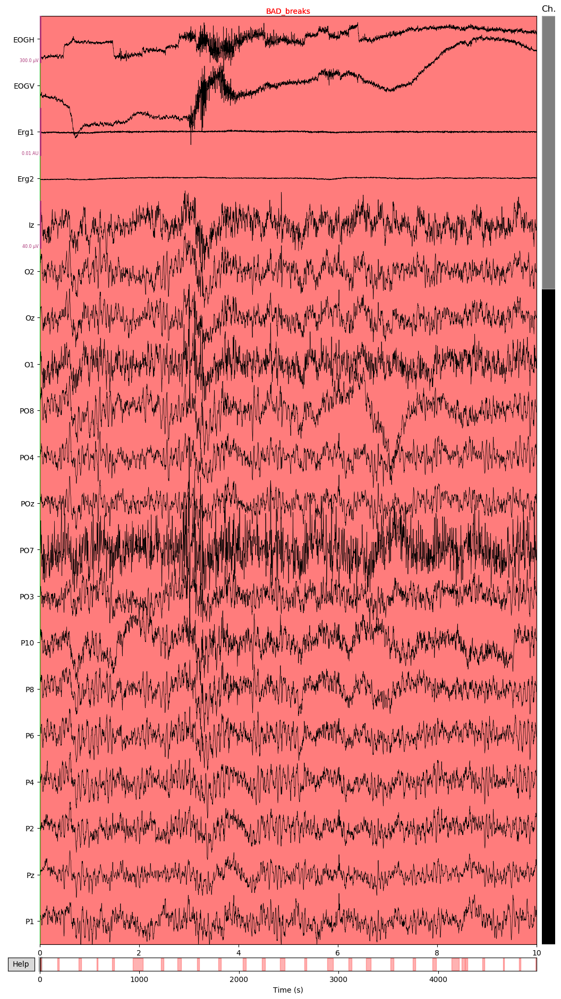

In [15]:
%matplotlib qt

filt_raw.plot(events=stim_rep_evts, event_color=color_dict, remove_dc=True, order=ch_order)

Notes based on raw inspection : 
- lot of slow drifts related to EOG on P9, P10, TP8, TP7, T8, FT8, F8, AF8, AF7, FP1, FP2 especially on the first two blocks, also includes P5, P7 and P9. Shoul dreally check wether ICA gest rid of it
- P3 hase regular drifts
- artifact linked to response button

Number of annotation + saving

In [16]:
filt_raw.annotations

<Annotations | 136 segments: BAD_ (108), BAD_breaks (28)>

In [17]:
filt_raw.annotations.save('%s/saved_annotations_%s.csv'%(name_subj,name_subj))
#annot_from_file = mne.read_annotations('saved-annotations.csv')
#print(annot_from_file)

Saving the (high-pass filtered) data with the annotations for breaks and artifact

In [18]:
filt_raw.save("%s/pre_ica_%s.fif"%(name_subj,name_subj),overwrite=True)

Writing /media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_ica_S8.fif


<ipython-input-18-b5f5a09c0b2f>:1: RuntimeWarning: This filename (/media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_ica_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw.save("%s/pre_ica_%s.fif"%(name_subj,name_subj),overwrite=True)


Closing /media/gabriel/DATA/ForceEEG/processing_EEG/S8/pre_ica_S8.fif [done]


# Fitting ICA

In [ ]:
filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)

Opening raw data file S8/pre_ica_S8.fif...


<ipython-input-2-a412b60167ca>:1: RuntimeWarning: This filename (S8/pre_ica_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)


    Range : 0 ... 5107711 =      0.000 ...  4987.999 secs
Ready.
Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...


In [4]:
ica = mne.preprocessing.ICA(max_pca_components = 64-len(filt_raw.info["bads"])-1) #-1 because better when average reference is used (rank)
ica.fit(filt_raw.crop(tmin=1000), reject_by_annotation=True, decim=2)
        #I use decim=2 to downsample to 512Hz because ICA eats up a lot of RAM For this subjct I also crop the 3 first block for that reason

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Omitting 799854 of 4083712 (19.59%) samples, retaining 3283858 (80.41%) samples.
Selecting all PCA components: 63 components
Fitting ICA took 335.4s.


<ICA  |  raw data decomposition, fit (fastica): 1641929 samples, 63 components, channels used: "eeg">

In [5]:
ica.save("%s/ICA_object_%s.fif"%(name_subj,name_subj))

Writing ICA solution to S8/ICA_object_S8.fif...


<ipython-input-5-999a4b462724>:1: RuntimeWarning: This filename (S8/ICA_object_S8.fif) does not conform to MNE naming conventions. All ICA files should end with -ica.fif, -ica.fif.gz, _ica.fif or _ica.fif.gz
  ica.save("%s/ICA_object_%s.fif"%(name_subj,name_subj))


<ICA  |  raw data decomposition, fit (fastica): 1641929 samples, 63 components, channels used: "eeg">

# Inspecting ICA

__Nota Bene__ : I fitted the ICA on the filtered continuous data, however I want to know how the ICA cleaned the epoched data, hence I inspect the ICA components mainly on the epoched data from the raw data (no low-pass filter other than the one used by biosemi, 0.01 Hz right ?)

In [2]:
raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=True)

Opening raw data file S8/pre_rejection_S8.fif...


<ipython-input-2-9ec950cf2067>:1: RuntimeWarning: This filename (S8/pre_rejection_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw = mne.io.read_raw_fif("%s/pre_rejection_%s.fif"%(name_subj,name_subj), preload=True)


    Range : 0 ... 5107711 =      0.000 ...  4987.999 secs
Ready.
Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...


In [3]:
annot_from_file = mne.read_annotations('%s/saved_annotations_%s.csv'%(name_subj,name_subj))
raw.set_annotations(annot_from_file)
print(raw.annotations)

<Annotations | 136 segments: BAD_ (108), BAD_breaks (28)>


In [4]:
ica = mne.preprocessing.read_ica("%s/ICA_object_%s.fif"%(name_subj,name_subj))

Reading S8/ICA_object_S8.fif ...
Now restoring ICA solution ...


<ipython-input-4-c4cd4f34906e>:1: RuntimeWarning: This filename (S8/ICA_object_S8.fif) does not conform to MNE naming conventions. All ICA files should end with -ica.fif, -ica.fif.gz, _ica.fif or _ica.fif.gz
  ica = mne.preprocessing.read_ica("%s/ICA_object_%s.fif"%(name_subj,name_subj))


Ready.


### Visualizing on epochs

In [5]:
trig_id = {'low/speed/left/1':1111,'low/speed/left/2':1112,'low/speed/left/3':1113,
           'low/speed/right/1':1121,'low/speed/right/2':1122,'low/speed/right/3':1123,
           'low/accuracy/left/1':1211,'low/accuracy/left/2':1212,'low/accuracy/left/3':1213,
           'low/accuracy/right/1':1221,'low/accuracy/right/2':1222,'low/speed/accuracy/3':1223,
          'high/speed/left/1':2111,'high/speed/left/2':2112,'high/speed/left/3':2113,
           'high/speed/right/1':2121,'high/speed/right/2':2122,'high/speed/right/3':2123,
           'high/accuracy/left/1':2211,'high/accuracy/left/2':2212,'high/accuracy/left/3':2213,
           'high/accuracy/right/1':2221,'high/accuracy/right/2':2222,'high/speed/accuracy/3':2223,} # used for segmentation

original_evts = pd.read_csv('%s/events_%s.csv'%(name_subj, name_subj), index_col=0)

evts = original_evts.values
evts[:,2] = evts[:,1]

epochs_ica = mne.Epochs(raw, evts, event_id=trig_id, tmin=-0.5, tmax=1, preload=True)

2448 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2448 events and 1537 original time points ...
130 bad epochs dropped


In [6]:
epochs_ica.resample(500)

<Epochs  |   2318 events (all good), -0.5 - 0.998 sec, baseline [None, 0], ~955.6 MB, data loaded,
 'high/accuracy/left/1': 98
 'high/accuracy/left/2': 98
 'high/accuracy/left/3': 99
 'high/accuracy/right/1': 97
 'high/accuracy/right/2': 98
 'high/speed/accuracy/3': 94
 'high/speed/left/1': 98
 'high/speed/left/2': 93
 'high/speed/left/3': 91
 'high/speed/right/1': 83
 'high/speed/right/2': 88
 'high/speed/right/3': 86
 'low/accuracy/left/1': 95
 'low/accuracy/left/2': 97
 'low/accuracy/left/3': 98
 'low/accuracy/right/1': 101
 'low/accuracy/right/2': 99
 'low/speed/accuracy/3': 99
 'low/speed/left/1': 99
 'low/speed/left/2': 102
 'low/speed/left/3': 102
 'low/speed/right/1': 101
 'low/speed/right/2': 100
 'low/speed/right/3': 102>

### ICs epoch timecourse


In [6]:
%matplotlib qt 
ica.plot_sources(epochs_ica);

__Nota Bene__ : epochs are dropped if artifact is in the epoch window

Notes from epoch time course of the ICs : 
- ICA0 varies a lot around stim check topomap
- ICA01 blink
- suspicious : IC 0, 2, 3, 4, 8, 10, 15,18, 19, 23, 24, 36, 40,46, 49, 50, 56, 59
- EMG : 29, 33, 52

### ICs topomap

In [7]:
ica.plot_components();

Notes on ICs based on topomap  : 
- ICA 6 = blinks
- Suspicious: ICA2, 4, 8 should capture the slow drifts noted in the raw insepction, 20
- saccades/face EMG : 10, 14 , 18, 24, 25, 31, 33, 34, 35, 40, 41, 45, 54, 59
- EMG : 9, 17, 19, 22, 23,27, 30, 36, 42, 47
- channel noise : 11 (P3)


## Individual ICs inspection

During the next lines I inspect each EOG, EMG or suspicious IC and decide, after the plots of each category, wether to KEEP or to REJECT the IC

### EOG : Checking against recorded EOG (horizontal and vertical)

This section looks at the covariation between the recorded EOG (horizontal and vertical) and the extracted ICs to find those ICs that likely contains eyes artifacts

In [7]:
filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)

eog_indices, eog_scores = ica.find_bads_eog(filt_raw.resample(500))
ica.exclude = eog_indices

Opening raw data file S8/pre_ica_S8.fif...


<ipython-input-7-af9efacd6f55>:1: RuntimeWarning: This filename (S8/pre_ica_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  filt_raw = mne.io.read_raw_fif("%s/pre_ica_%s.fif"%(name_subj,name_subj), preload=True)


    Range : 0 ... 5107711 =      0.000 ...  4987.999 secs
Ready.
Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...
Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7344 events found
Event IDs: [768 769 770 868 879 880 881 889 890 891 895 968 979 980 981 989 990 991]
Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7272 events found
Event IDs: [768 769 770 868 879 880 881 889 890 891 968 979 980 981 989 990 991]
Omitting 472376 of 2494000 (18.94%) samples, retaining 2021624 (81.06%) samples.
Omitting 472376 of 2494000 (18.94%) samples, retaining 2021624 (81.06%) samples.
Omitting 472376 of 2494000 (18.94%) samples, retaining 2021624 (81.06%) samples.


<ipython-input-7-af9efacd6f55>:3: RuntimeWarning: Resampling of the stim channels caused event information to become unreliable. Consider finding events on the original data and passing the event matrix as a parameter.
  eog_indices, eog_scores = ica.find_bads_eog(filt_raw.resample(500))


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 8192 samples (16.384 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 8192 s

Now I plot the scores, namely the "covariance" between HEOG (top panel), VEOG (lower panel) and the ICs (x axis)

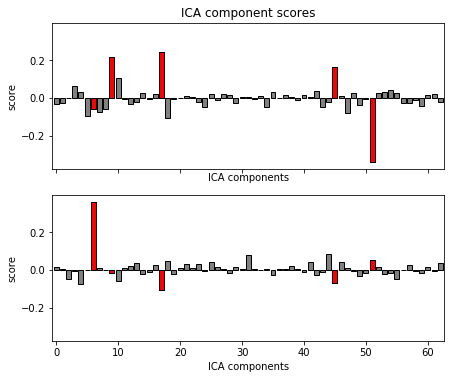

In [8]:
%matplotlib inline 
ica.plot_scores(eog_scores);

MNE's algorithm extracted automatically the following ICs :

In [9]:
eog_indices

[6, 51, 17, 9, 45]

Now I plot for each of these components the topomap; the activity for the created epochs around the stimulus (presentation of the stimuls at 0.2 sec); the spectrum, and the variance of the IC measured at each epoch (watch out the y-axis of this last plot varies a lot across ICs)

    Using multitaper spectrum estimation with 7 DPSS windows
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


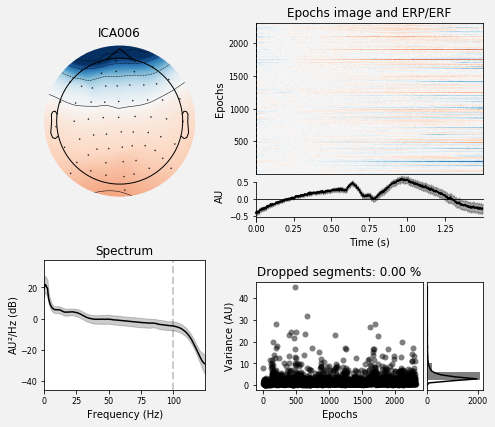

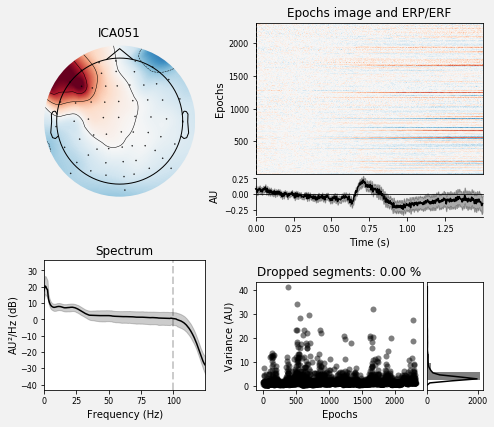

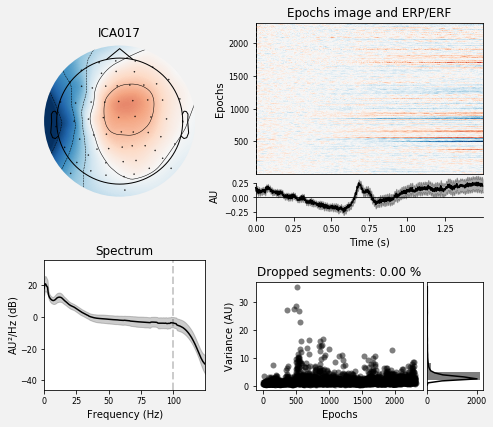

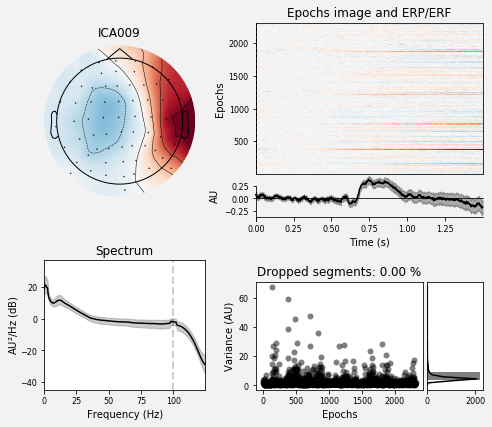

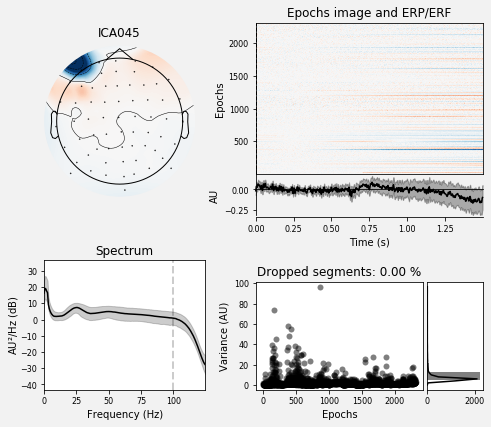

In [7]:
ica.plot_properties(epochs_ica, picks=[]);

#### Interpretation of the EOG ICs
- ICA 6 contains blinks REJECT
- 45, 51 = Saccades REJECT
- 9, 17 = does seem to contain mainly legit brain acitivity, peaks at alpha, KEEP


In [8]:
ica.exclude = []
eog_comp = [6,45,51]

### EMG components

#### Suspected EMG activity from the face

from the notes above the general plot of the ICs (time course and topomap) I look at 2, 15, 17, 34

    Using multitaper spectrum estimation with 7 DPSS windows
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseli

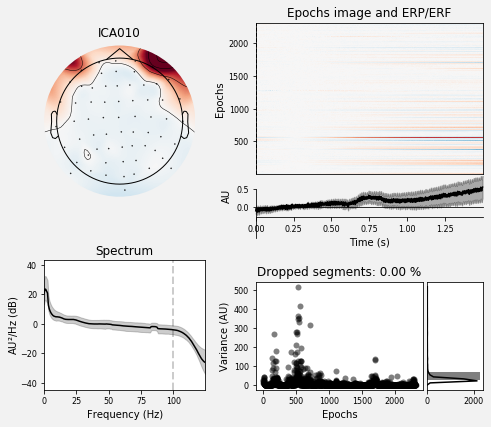

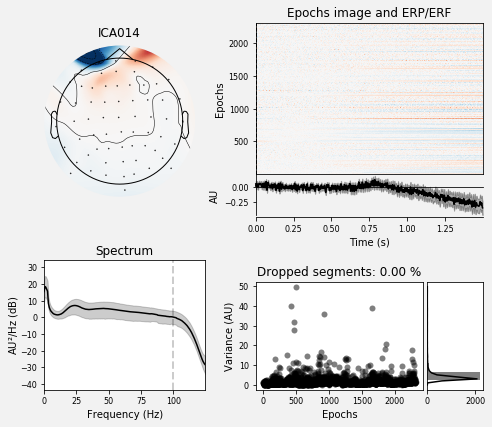

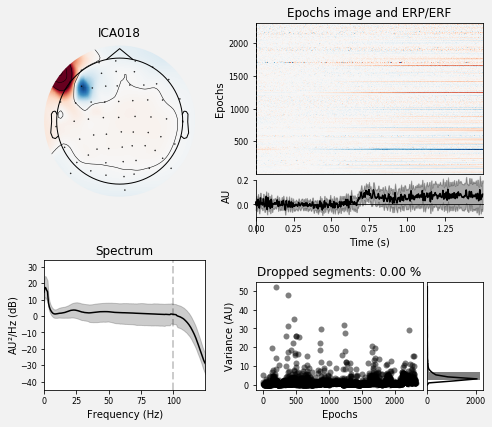

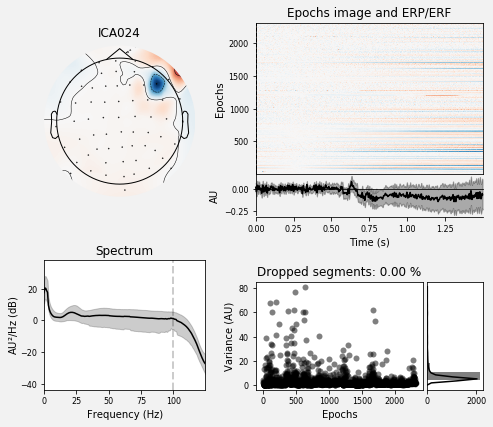

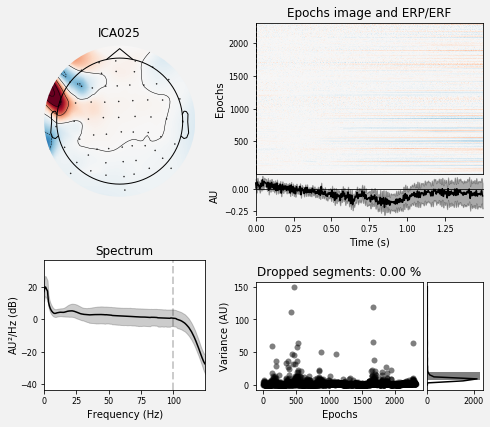

...

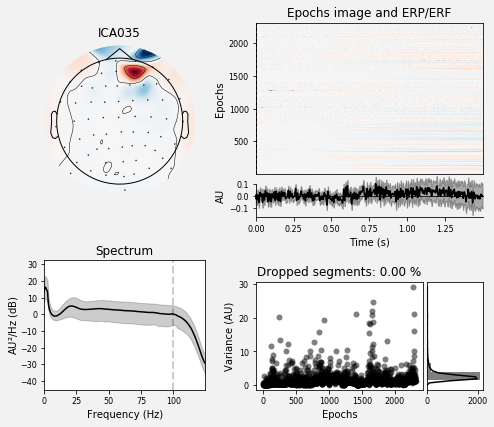

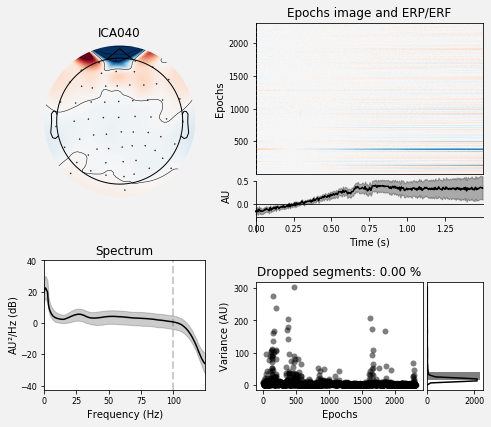

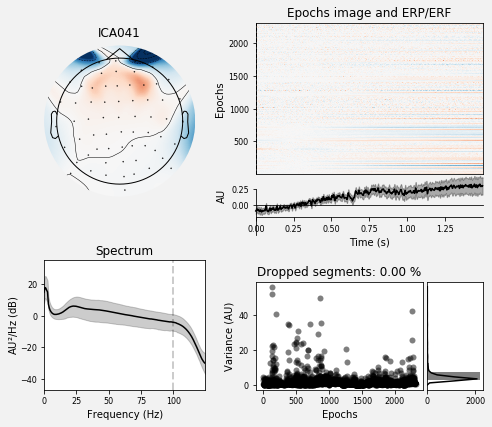

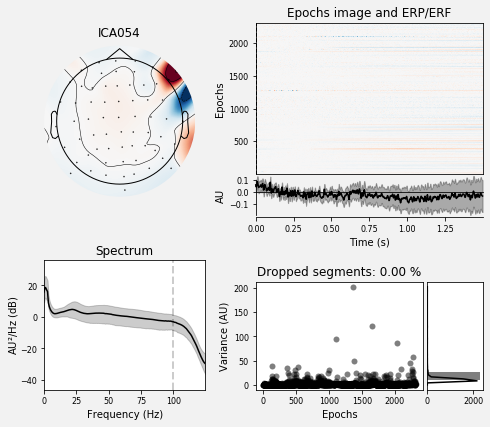

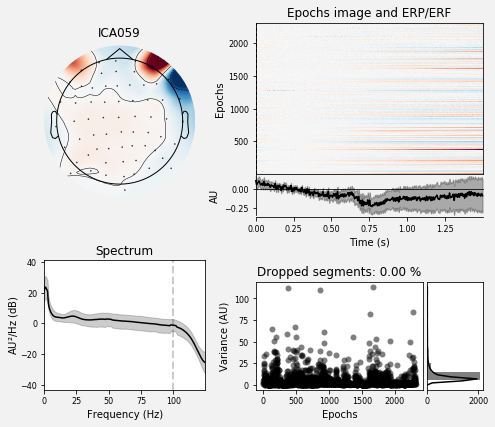

In [9]:
ica.plot_properties(epochs_ica, picks=[10, 14 , 18, 24, 25, 31, 33, 34, 35, 40, 41, 54, 59]);

- ICA 10, 14, 18, 24, 25, 40, 41, 54, 59  : high variance, later in the trial, no characteristic EEG spectrum with 25Hz peak, face located REJECT
- ICA 31 has same profile as above but some stim related activity and peak at 80 Hz REJECT
- ICA 33, 34 : low variance, stim related activity KEEP
- ICA 35 : no stim related activity, 25Hz peak REJECT

In [17]:
face_emg_comp = [10, 14, 18, 24, 25, 31, 35, 40, 41, 54, 59]

#### Other suspected EMGs

From the notes : 19, 22, 23,27, 29, 30, 36, 42, 47, 52

    Using multitaper spectrum estimation with 7 DPSS windows
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseli

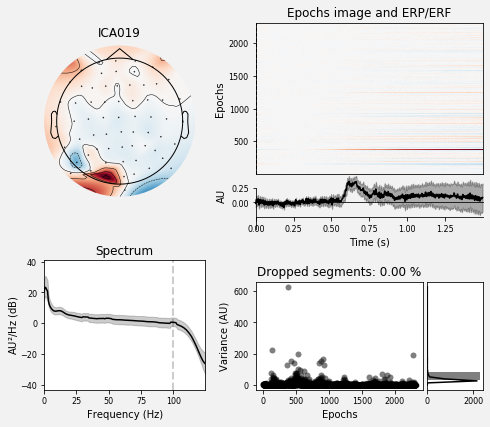

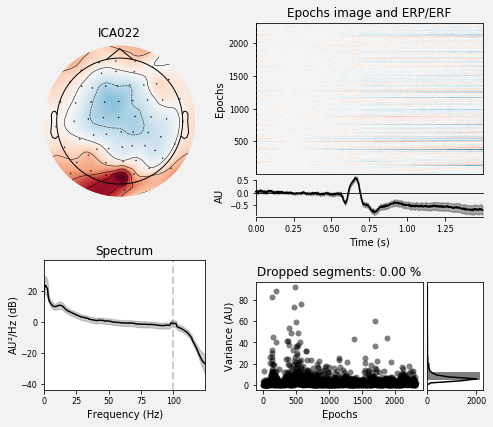

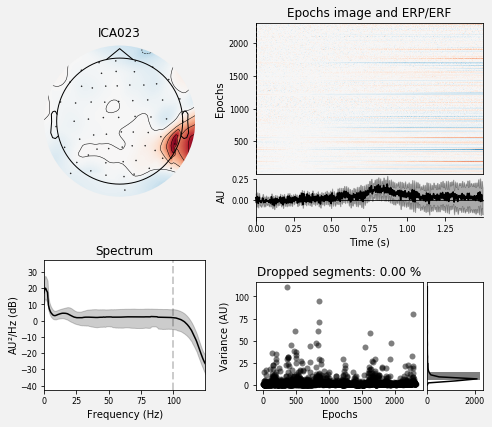

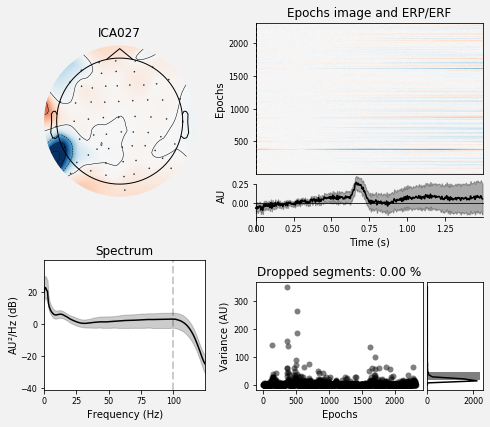

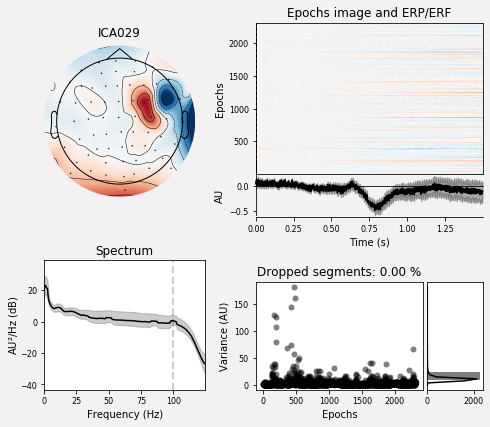

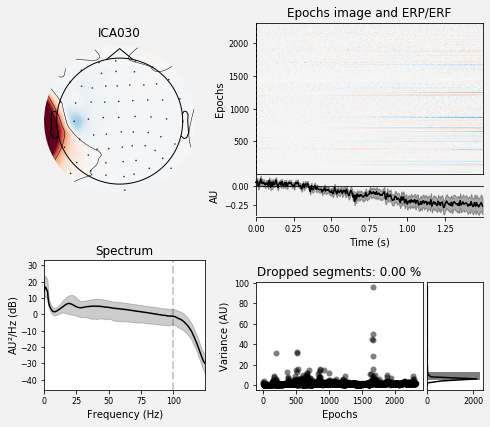

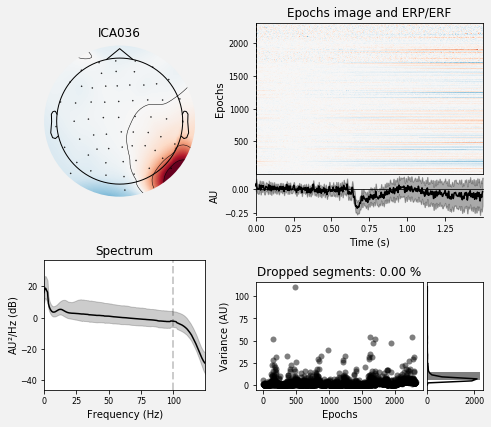

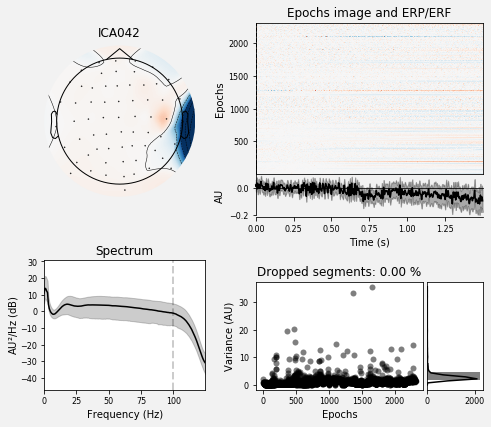

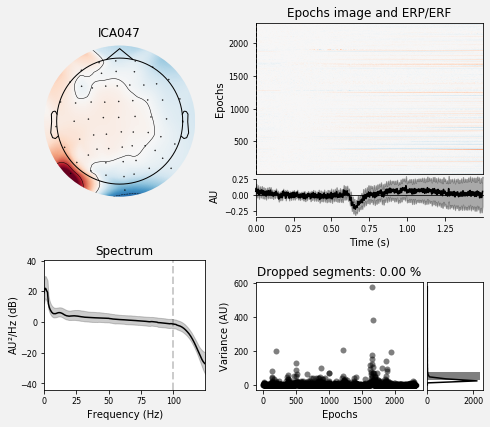

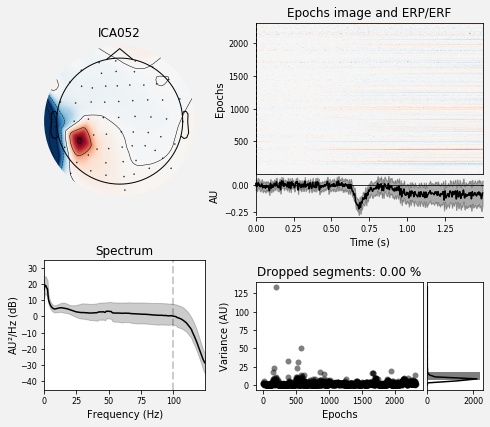

In [10]:
ica.plot_properties(epochs_ica, picks=[ 19, 22, 23,27, 29, 30, 36, 42, 47, 52]);

- ICA 19, 27, 29, 47 : large variation but only on some epochs, in our ROI, unclear spectrum, stim related activity KEEP
- ICA 22, 36, 52 : in our ROI, unclear spectrum, stim related activity KEEP
- ICA 23, 30, 42 : EMG neck REJECT


In [11]:
other_emg_comp = [23, 30, 42]

## Other strange components

Notes from epoch time course of the ICs : 
- suspicious : IC 0,1, 2, 3, 4, 8, 15, 46, 49, 50, 56
- EMG : 29, 52

Notes on ICs based on topomap  : 
- Suspicious: ICA2, 4, 8 should capture the slow drifts noted in the raw insepction, 20
- channel noise : 11 (P3)


In [13]:
np.sort(np.asarray([ 6, 51, 17, 9, 45, 19, 22, 23,27, 29, 30, 36, 42, 47, 52,10, 14 , 18, 24, 25, 31, 33, 34, 35, 40, 41, 54, 59]))

array([ 6,  9, 10, 14, 17, 18, 19, 22, 23, 24, 25, 27, 29, 30, 31, 33, 34,
       35, 36, 40, 41, 42, 45, 47, 51, 52, 54, 59])

based on notes : 4, 5, 9, 11, 12, 13, 26, 36, 49, 55

    Using multitaper spectrum estimation with 7 DPSS windows
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
2318 matching events found
No baseli

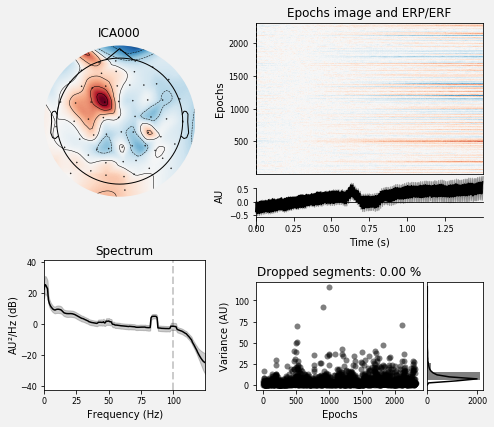

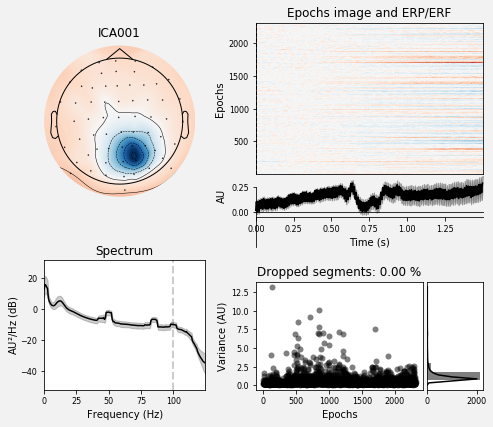

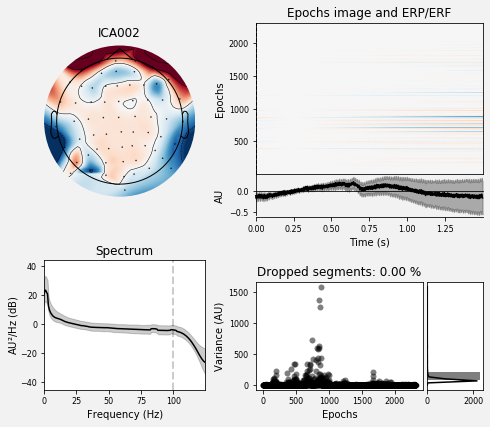

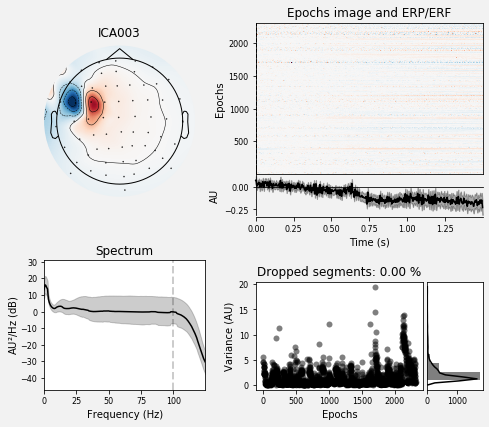

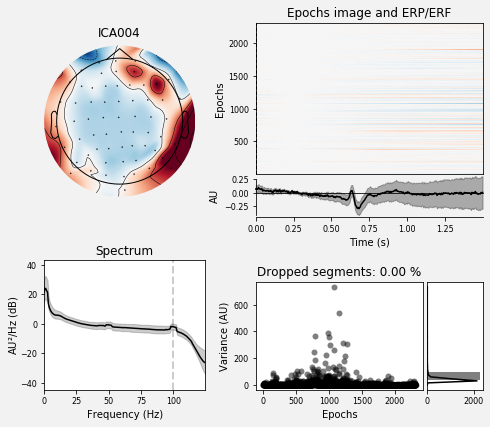

...

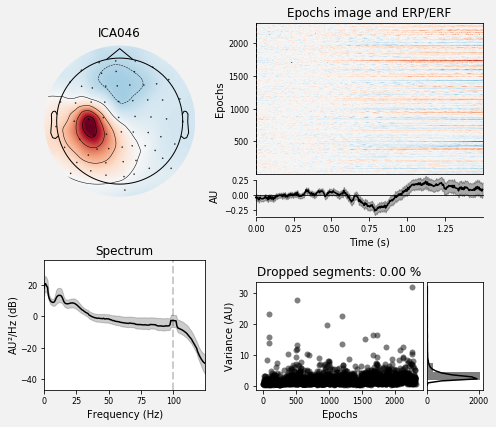

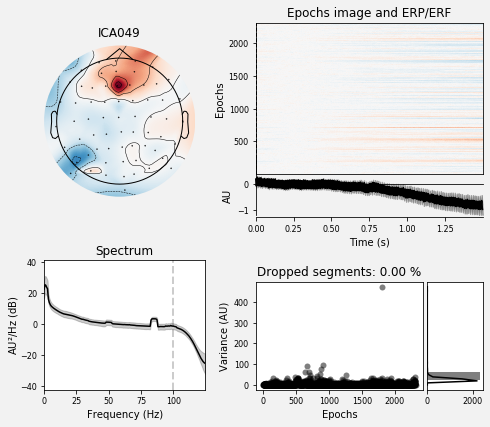

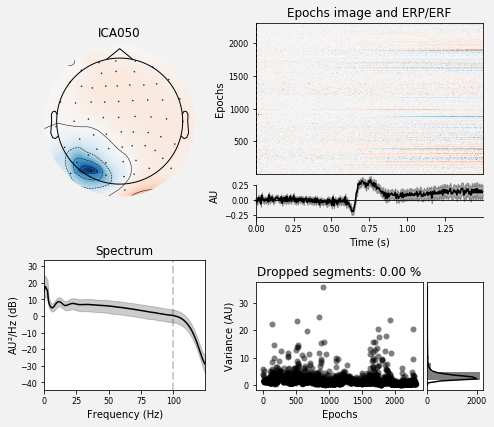

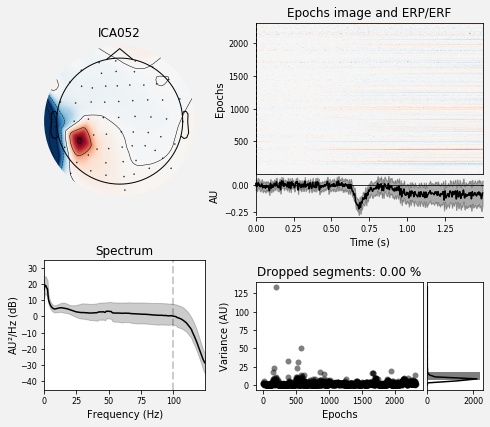

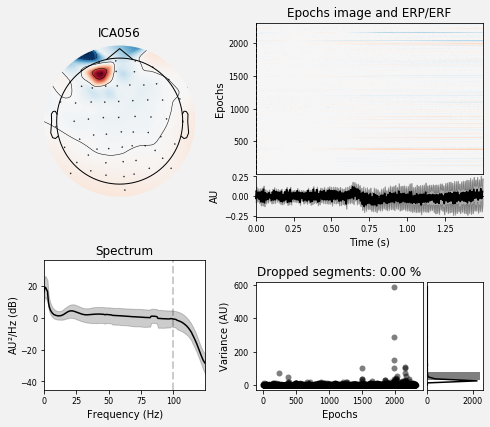

In [14]:
ica.plot_properties(epochs_ica, picks=[ 0,1, 2, 3, 4, 8, 11, 15, 20, 29, 46, 49, 50, 52, 56]);

- ICA0, 1, 3 : peak at 80 Hz (and 50Hz for 1), unclear topomap (in our ROI) and stim related activity, KEEP
- IC2 and IC 8 are the artifact (on different epochs) sawn on the raw inspection, high variance REJECT
- IC4 same as IC2 on different epochs but clearer stim related activity, KEEP
- IC11 : channel noise but still stim related activity, low var on most trials, KEEP
- IC49 : channel noise, low var on most trials, but barely stim related activity REJECT
- IC15, 46, 50, 52 : no reason KEEP
- IC56 : EMG face, REJECT 
- IC29 : in our motor ROI, stim related activity, high var on few trials KEEP




In [15]:
other_comp = [2,8,49,56]

## Final exclusions of ICA components :

In [18]:
ica.exclude = eog_comp + face_emg_comp + other_emg_comp + other_comp 
print(ica.exclude)

[6, 45, 51, 9, 17, 10, 14, 18, 24, 25, 31, 35, 40, 41, 54, 59, 23, 30, 42, 2, 8, 49, 56]


In [19]:
ica.apply(raw)


Transforming to ICA space (63 components)
Zeroing out 23 ICA components


<Raw | pre_rejection_S8.fif, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

## Interpolating the bad electrodes after ICA

In [20]:
raw.info['bads']

[]

No electrode to interpolate 

# Saving the final preprocessed data

In [21]:
raw.save("preprocessed_data/preprocessed_%s.fif"%name_subj,overwrite=True) #sauvegarde les données au format fif pour la suite des traitements

Writing /media/gabriel/DATA/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S8.fif


<ipython-input-21-712b88ba4c09>:1: RuntimeWarning: This filename (/media/gabriel/DATA/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw.save("preprocessed_data/preprocessed_%s.fif"%name_subj,overwrite=True) #sauvegarde les données au format fif pour la suite des traitements


Closing /media/gabriel/DATA/ForceEEG/processing_EEG/preprocessed_data/preprocessed_S8.fif [done]


# Annexe 1: Comparing before/after ICA

Just for illustration puprose I plot the data on the epoch domain befaore and after ICA.

In [5]:
ica.exclude = [6, 45, 51, 9, 17, 10, 14, 18, 24, 25, 31, 35, 40, 41, 54, 59, 23, 30, 42, 2, 8, 49, 56]


raw.resample(sfreq=500) # I resample but just for viz of the difference with/without ICA
reconst_raw = raw.copy()
ica.apply(reconst_raw)



Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7344 events found
Event IDs: [768 769 770 868 879 880 881 889 890 891 895 968 979 980 981 989 990 991]
Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7272 events found
Event IDs: [768 769 770 868 879 880 881 889 890 891 968 979 980 981 989 990 991]


<ipython-input-5-ecd1b15f7222>:4: RuntimeWarning: Resampling of the stim channels caused event information to become unreliable. Consider finding events on the original data and passing the event matrix as a parameter.
  raw.resample(sfreq=500) # I resample but just for viz of the difference with/without ICA


Transforming to ICA space (63 components)
Zeroing out 23 ICA components


<Raw | pre_rejection_S8.fif, 72 x 2494000 (4988.0 s), ~1.34 GB, data loaded>

Trigger channel has a non-zero initial value of 66304 (consider using initial_event=True to detect this event)
7272 events found
Event IDs: [768 769 770 868 879 880 881 889 890 891 968 979 980 981 989 990 991]
2423 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
2423 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 2423 events and 451 original time points ...
111 bad epochs dropped
Loading data for 384 events and 451 original time points ...
Loading data for 20 events and 451 original time points ...


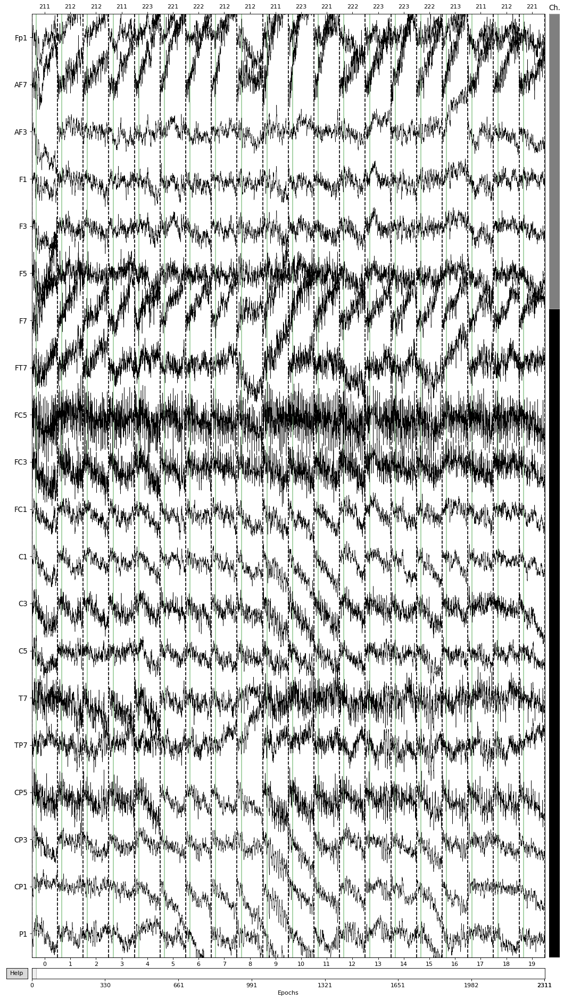

Loading data for 2423 events and 451 original time points ...
111 bad epochs dropped
Loading data for 384 events and 451 original time points ...
Loading data for 20 events and 451 original time points ...


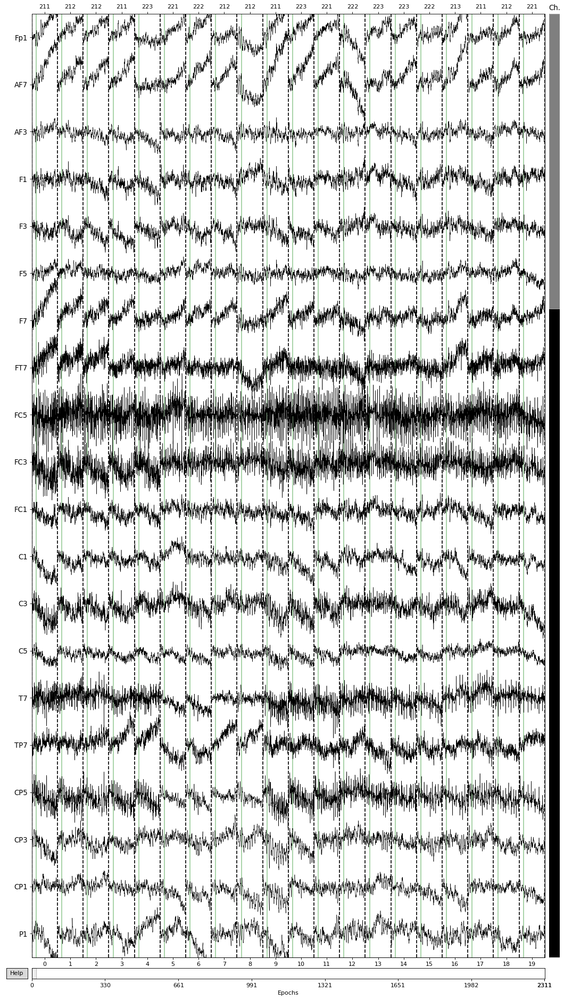

In [6]:
%matplotlib inline
trig_id = {'speed/left/1':111,'speed/left/2':112,'speed/left/3':113,
           'speed/right/1':121,'speed/right/2':122,'speed/right/3':123,
           'accuracy/left/1':211,'accuracy/left/2':212,'accuracy/left/3':213,
           'accuracy/right/1':221,'accuracy/right/2':222,'speed/accuracy/3':223,} # used for segmentation

mne_events = mne.find_events(raw, shortest_event=1)
mne_events[:,2] = mne_events[:,2] - mne_events[:,1]

raw_epochs = mne.Epochs(raw, mne_events, event_id=trig_id, tmin=-0.15, tmax=.75)
reconst_epochs = mne.Epochs(reconst_raw, mne_events, event_id=trig_id, tmin=-0.15, tmax=.75)
raw_epochs.plot(n_epochs=20,scalings = dict(eeg=40e-6), title="Without ICA");
reconst_epochs.plot(n_epochs=20,scalings = dict(eeg=40e-6), title="With ICA");

# Annexe 2: Taking a look at the ERP in monopolar

Again just for illustration purpose I plot the ERP in monopolar (average referenced and low-pass filtered at 30Hz to make pretty plots :-)

In [2]:
raw = mne.io.read_raw_fif("preprocessed_data/preprocessed_%s.fif"%name_subj, preload=True)

Opening raw data file preprocessed_data/preprocessed_S8.fif...


<ipython-input-2-a6e7427b25aa>:1: RuntimeWarning: This filename (preprocessed_data/preprocessed_S8.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  raw = mne.io.read_raw_fif("preprocessed_data/preprocessed_%s.fif"%name_subj, preload=True)


    Range : 0 ... 5107711 =      0.000 ...  4987.999 secs
Ready.
Reading 0 ... 5107711  =      0.000 ...  4987.999 secs...


In [3]:
raw.filter(None, 30, None,l_trans_bandwidth='auto',filter_length='auto',phase='zero') 


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 451 samples (0.440 sec)



<Raw | preprocessed_S8.fif, 72 x 5107712 (4988.0 s), ~2.74 GB, data loaded>

### Creating epochs

In [4]:
trig_id = {'low/speed/left/1':1111,'low/speed/left/2':1112,'low/speed/left/3':1113,
           'low/speed/right/1':1121,'low/speed/right/2':1122,'low/speed/right/3':1123,
           'low/accuracy/left/1':1211,'low/accuracy/left/2':1212,'low/accuracy/left/3':1213,
           'low/accuracy/right/1':1221,'low/accuracy/right/2':1222,'low/speed/accuracy/3':1223,
          'high/speed/left/1':2111,'high/speed/left/2':2112,'high/speed/left/3':2113,
           'high/speed/right/1':2121,'high/speed/right/2':2122,'high/speed/right/3':2123,
           'high/accuracy/left/1':2211,'high/accuracy/left/2':2212,'high/accuracy/left/3':2213,
           'high/accuracy/right/1':2221,'high/accuracy/right/2':2222,'high/speed/accuracy/3':2223,} # used for segmentation

original_evts = pd.read_csv('%s/events_%s.csv'%(name_subj, name_subj), index_col=0)

evts = original_evts.values
evts[:,2] = evts[:,1]

In [5]:
epochs = mne.Epochs(raw, evts, event_id=trig_id, tmin=-0.3, tmax=.8)

2448 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated


### Visualizing contrast on occipital electrodes

Loading data for 816 events and 1127 original time points ...
37 bad epochs dropped
779 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


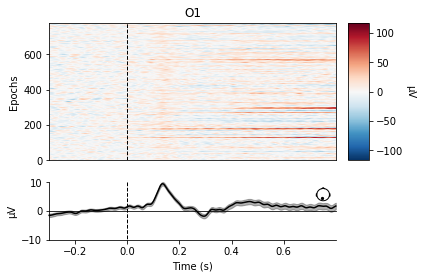

In [6]:
epochs['1'].plot_image(picks=["O1"]);

Loading data for 816 events and 1127 original time points ...
37 bad epochs dropped
779 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


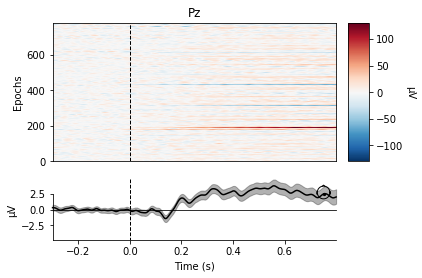

In [8]:
epochs['1'].plot_image(picks=["Pz"]);

More than 6 channels, truncating title ...
Loading data for 816 events and 1127 original time points ...
37 bad epochs dropped
779 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "mean"


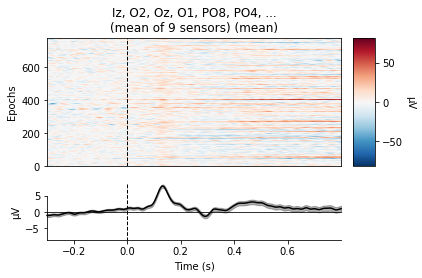

In [7]:
epochs['1'].plot_image(picks=["Iz","O2","Oz","O1", "PO8","PO4","POz","PO3","PO7"],combine="mean");

### looking at the difference between lowest and highest contrast across time and electrodes

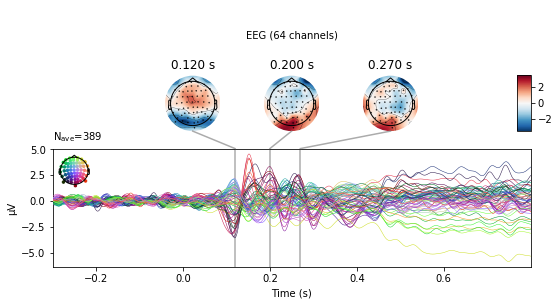

In [10]:
un = epochs["1"].average()
trois = epochs["3"].average()
diff = mne.combine_evoked((un, -trois), weights='equal')
diff.plot_joint(times=[.12,.2,.27]);

### looking at the difference between low and high force across time and electrodes

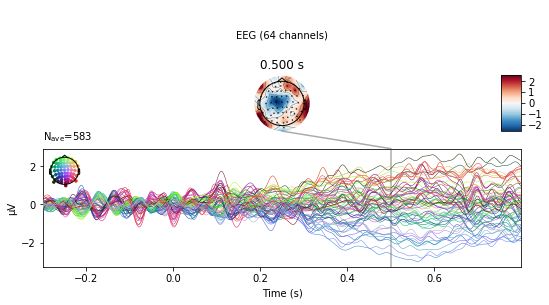

In [11]:
high = epochs["high"].average()
low = epochs["low"].average()
diff = mne.combine_evoked((high, -low), weights='equal')
diff.plot_joint(times=.5);